## Importing libraries

In [1]:
#%pip install cufflinks

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from scipy import stats
%matplotlib inline
import cufflinks as cf


from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

C:\Users\anurag\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
df = pd.read_csv('C://Users/anurag/Documents/SIT307/Assignment2/melb_data.csv')
df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,26/08/2017,16.7,3150.0,...,2.0,2.0,652.0,NaN,1981.0,NaN,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,26/08/2017,6.8,3016.0,...,2.0,2.0,333.0,133.0,1995.0,NaN,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,26/08/2017,6.8,3016.0,...,2.0,4.0,436.0,NaN,1997.0,NaN,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,26/08/2017,6.8,3016.0,...,1.0,5.0,866.0,157.0,1920.0,NaN,-37.85908,144.89299,Western Metropolitan,6380.0


## Data cleaning:

### Finding the amount null values for the four attributes that have null values.

In [4]:
def remove_rows(col1, col2, col3, col4):
    count = 0
    types = df.dtypes
    for record_index in range(len(df)):
        incorrect_values = 0
        for key in df.keys():
            if key != "{}".format(col1) and key != "{}".format(col2):
                if pd.isna(df[key][record_index]):
                    incorrect_values+=1
                elif key == "{}".format(col3) or key == "{}".format(col4):
                    if df[key][record_index] == 0:
                        incorrect_values+=1
        if incorrect_values > 1:
            count+=1
            
    print(count)
    
remove_rows('BuildingArea', 'YearBuilt', 'Bedroom2', 'Bathroom')
remove_rows('Bedroom2', 'Bathroom', 'BuildingArea', 'YearBuilt')
remove_rows('Bedroom2', 'BuildingArea', 'Bathroom', 'YearBuilt')

68
5264
675


In [5]:
df['Car'].isna().sum()  #62 null
df['YearBuilt'].isna().sum()   #5375
df['BuildingArea'].isna().sum()   #6450
df['CouncilArea'].isna().sum()   #1369

1369

### Filling out null values of CouncilArea by linking each council to a range of suburbs, using .isin. 

In [6]:
# rename df CouncilArea column for later concate
df = df.rename({'CouncilArea': 'X'}, axis=1)

# pd.set_option("max_rows", None)
pd.reset_option('display.max_rows')

# group each Suburb to the right Council
bayside=df[df['Suburb'].isin(['Beaumaris','Black Rock','Brighton','Hampton','Hampton East','Sandringham', 'Brighton East'])]
bayside.loc[:, 'CouncilArea'] = 'Bayside'

banyule=df[df['Suburb'].isin(['Bellfield','Briar Hill','Eaglemont','Heidelberg','Heidelberg Heights','Heidelberg West','Ivanhoe','Ivanhoe East','Lower Plenty','Montmorency','Rosanna','St Helena','Viewbank','Watsonia','Watsonia North','Yallambie'])]
banyule.loc[:, 'CouncilArea'] = 'Banyule'

boroondara=df[df['Suburb'].isin(['Ashburton','Balwyn','Camberwell','Canterbury','Deepdene','Hawthorn','Hawthorn East','Kew','Kew East'])]
boroondara.loc[:, 'CouncilArea'] = 'Boroondara'

brimbank=df[df['Suburb'].isin(['Albanvale','Albion','Ardeer','Cairnlea','Calder Park','Deer Park','Delahey','Derrimut','Kealba','Keilor Downs','Keilor Lodge','Keilor North','Keilor Park','Kings Park','St Albans','Sunshine','Sunshine North','Sunshine West','Sydenham','Taylors Lakes'])]
brimbank.loc[:, 'CouncilArea'] = 'Brimbank'

cardinia=df[df['Suburb'].isin(['Avonsleigh','Bayles','Beaconsfield Upper','Bunyip','Bunyip North','Caldermeade','Cardinia','Catani','Clematis','Cockatoo','Cora Lynn','Dalmore','Dewhurst','Garfield','Garfield North','Gembrook','Guys Hill','Iona','Koo Wee Rup','Koo Wee Rup North','Lang Lang East','Maryknoll','Monomeith','Mount Burnett','Nangana','Nar Nar Goon','Nar Nar Goon North','Officer','Officer South','Pakenham','Pakenham South','Pakenham Upper','Rythdale','Tonimbuk','Tynong','Tynong North','Vervale','Yannathan'])]
cardinia.loc[:, 'CouncilArea'] = 'Cardinia'

casey=df[df['Suburb'].isin(['Berwick','Blind Bight','Botanic Ridge','Cannons Creek','Clyde','Clyde North','Cranbourne','Cranbourne East','Doveton','Eumemmerring','Hallam','Harkaway','Lynbrook','Warneet','Cranbourne North','Cranbourne South','Cranbourne West','Junction Village','Hampton Park','Endeavour Hills','Devon Meadows','Lysterfield South','Narre Warren','Narre Warren South','Narre Warren North'])]
casey.loc[:, 'CouncilArea'] = 'Casey'

frankston=df[df['Suburb'].isin(['Carrum Downs','Frankston North','Frankston South','Langwarrin South','Sandhurst','Seaford','Skye','Frankston','Langwarrin'])]
frankston.loc[:, 'CouncilArea'] = 'Frankston'

darebin=df[df['Suburb'].isin(['Kingsbury','Northcote','Preston','Reservoir','Thornbury'])]
darebin.loc[:, 'CouncilArea'] = 'Darebin'

greater_dandenong=df[df['Suburb'].isin(['Bangholme','Dandenong','Dandenong North','Dandenong South','Springvale South','Noble Park North','Noble Park','Keysborough','Springvale'])]
greater_dandenong.loc[:, 'CouncilArea'] = 'Greater Dandenong'

glen_eira=df[df['Suburb'].isin(['Bentleigh','Carnegie','Caulfield','Gardenvale','Elsternwick','McKinnon','Murrumbeena','Ormond','Bentleigh East','Caulfield East','Caulfield North','Caulfield South','Glen Huntly'])]
glen_eira.loc[:, 'CouncilArea'] = 'Glen Eira'
                          
hobsons_bay=df[df['Suburb'].isin(['Altona','Newport','Seabrook','Seaholme','Spotswood','Williamstown','Williamstown North','South Kingsville','Altona Meadows','Altona North'])]
hobsons_bay.loc[:, 'CouncilArea'] = 'Hobsons Bay'
                           
wyndham=df[df['Suburb'].isin(['Cocoroc','Tarneit','Quandong','Mambourin','Werribee','Hoppers Crossing','Laverton North','Point Cook','Wyndham Vale','Williams Landing','Werribee South'])]
wyndham.loc[:, 'CouncilArea'] = 'Wyndham'
                           
hume=df[df['Suburb'].isin(['Attwood','Broadmeadows','Bulla','Campbellfield','Kalkallo','Jacana','Greenvale','Dallas','Craigieburn','Coolaroo','Mickleham','Somerton','Sunbury','Yuroke','Wildwood','Westmeadows','Meadow Heights','Melbourne Airport','Oaklands Junction','Roxburgh Park','Gladstone Park'])]
hume.loc[:, 'CouncilArea'] = 'Hume'

manningham=df[df['Suburb'].isin(['Bulleen','Doncaster','Donvale','Warrandyte','Templestowe','Templestowe Lower','Warrandyte South','Doncaster East'])]
manningham.loc[:, 'CouncilArea'] = 'Manningham'
                             
knox=df[df['Suburb'].isin(['Bayswater','Boronia','Knoxfield','Scoresby','Rowville','Wantirna','Wantirna South','The Basin','Ferntree Gully'])]
knox.loc[:, 'CouncilArea'] = 'Knox'
                            
kingston=df[df['Suburb'].isin(['Aspendale','Bonbeach','Braeside','Carrum','Chelsea','Clarinda','Edithvale','Heatherton','Mentone','Moorabbin','Mordialloc','Parkdale','Waterways','Patterson Lakes','Moorabbin Airport','Dingley Village','Clayton South','Chelsea Heights','Aspendale Gardens'])]
kingston.loc[:, 'CouncilArea'] = 'Kingston'
 
maribyrnong=df[df['Suburb'].isin(['Braybrook', 'Footscray', 'Kingsville', 'Maidstone', 'Maribyrnong', 'Seddon', 'Tottenham', 'West Footscray', 'Yarraville'])]
maribyrnong.loc[:, 'CouncilArea'] = 'Maribyrnong'
                               
maroondah=df[df['Suburb'].isin(['Bayswater North','Croydon','Ringwood','Warranwood','Croydon Hills','Croydon North','Croydon South','Kilsyth South','Ringwood East'])]
maroondah.loc[:, 'CouncilArea'] = 'Maroondah'
                               
melbourne=df[df['Suburb'].isin(['Carlton', 'Docklands', 'East Melbourne', 'Melbourne', 'North Melbourne', 'Parkville', 'West Melbourne'])]
melbourne.loc[:, 'CouncilArea'] = 'Melbourne'
                               
moreland=df[df['Suburb'].isin(['Brunswick', 'Brunswick East', 'Brunswick West', 'Coburg', 'Coburg North', 'Fawkner', 'Glenroy', 'Gowanbrae', 'Hadfield', 'Oak Park', 'Pascoe Vale','Pascoe Vale South'])]
moreland.loc[:, 'CouncilArea'] = 'Moreland'
                               
monash=df[df['Suburb'].isin(['Ashwood',  'Clayton', 'Glen Waverley', 'Hughesdale', 'Huntingdale', 'Mount Waverley', 'Mulgrave', 'Notting Hill', 'Oakleigh', 'Oakleigh East',  'Wheelers Hill'])]
monash.loc[:, 'CouncilArea'] = 'Monash'
                               
melton=df[df['Suburb'].isin(['Brookfield', 'Burnside Heights', 'Caroline Springs',  'Kurunjang', 'Melton', 'Melton South', 'Melton West', 'Rockbank', 'Taylors Hill'])]
melton.loc[:, 'CouncilArea'] = 'Melton'
                               
moonee_valley=df[df['Suburb'].isin(['Keilor East','Aberfeldie', 'Airport West', 'Ascot Vale', 'Avondale Heights', 'Essendon', 'Essendon North', 'Essendon West',  'Moonee Ponds', 'Niddrie', 'Strathmore', 'Strathmore Heights', 'Travancore'])]
moonee_valley.loc[:, 'CouncilArea'] = 'Moonee Valley'
                               
stonnington=df[df['Suburb'].isin(['Armadale', 'Kooyong', 'Malvern', 'Malvern East', 'Prahran', 'Toorak'])]
stonnington.loc[:, 'CouncilArea'] = 'Stonnington'
                               
yarra=df[df['Suburb'].isin(['Abbotsford', 'Burnley',  'Clifton Hill', 'Collingwood', 'Cremorne',  'Fitzroy', 'Princes Hill', 'Richmond'])]
yarra.loc[:, 'CouncilArea'] = 'Yarra'
                               
port_phillip=df[df['Suburb'].isin(['Albert Park', 'Balaclava', 'Elwood', 'Middle Park',  'Ripponlea', 'South Melbourne', 'St Kilda'])]
banyule.loc[:, 'CouncilArea'] = 'Banyule'
                               
whitehorse=df[df['Suburb'].isin(['Blackburn', 'Blackburn North', 'Blackburn South', 'Box Hill',  'Burwood East', 'Forest Hill', 'Mitcham',  'Vermont South'])]
whitehorse.loc[:, 'CouncilArea'] = 'Whitehorse'

whittlesea=df[df['Suburb'].isin([ 'Epping', 'Lalor', 'Mernda', 'Mill Park', 'South Morang', 'Thomastown', 'Whittlesea', 'Wollert'])]
whittlesea.loc[:, 'CouncilArea'] = 'Whittlesea'

nillumbik=df[df['Suburb'].isin(['Diamond Creek', 'Eltham',  'Hurstbridge', 'North Warrandyte'])]
nillumbik.loc[:, 'CouncilArea'] = 'Nillumbik'

yarra_ranges=df[df['Suburb'].isin(['Chirnside Park', 'Healesville', 'Montrose', 'Mooroolbark', 'Mount Evelyn', 'Silvan', 'Upwey', 'Yarra Glen'])]
yarra_ranges.loc[:, 'CouncilArea'] = 'Yarra Ranges'

macedon_ranges=df[df['Suburb'].isin(['Bullengarook', 'Gisborne', 'Riddells Creek'])]
macedon_ranges.loc[:, 'CouncilArea'] = 'Macedon Ranges'

moorabool=df[df['Suburb'].isin(['Bacchus Marsh'])]
moorabool.loc[:, 'CouncilArea'] = 'Moorabool'

part=df[df['Suburb'].isin(['Cheltenham','Oakleigh South','Eltham North', 'Greensborough','Carlton North','Alphington','Doreen','Burwood', 'Chadstone','Southbank', 'Windsor','Highett','Bundoora','Diggers Rest','Fairfield', 'Hillside','Eltham North','Flemington', 'Kensington','Upper Ferntree Gully','Port Melbourne', 'South Yarra', 'Greensborough','Macleod','Fitzroy North','Surrey Hills','Mont Albert','Balwyn North','Glen Iris','Brooklyn','Hillside','Keilor','Tullamarine','Beaconsfield','Emerald','Heath Hill','Lang Lang','Modella','Menzies Creek','Longwarry','Nyora','Tooradin','Beaconsfield','Lyndhurst','Pearcedale','Tooradin','Alphington','Fairfield','Macleod','Lyndhurst','Brighton East','St Kilda East','Laverton','Eynesbury','Truganina','Mount Cottrell','Little River','Clarkefield','Diggers Rest','Nunawading','Park Orchards','Ringwood North','Wonga Park','Lysterfield','Sassafras','Oakleigh South','Wonga Park','Vermont','Ringwood North','Park Orchards','Kilsyth'])]
part.loc[:, 'CouncilArea'] = part['X']

councilList=[banyule, bayside, boroondara, brimbank, cardinia, casey, darebin,  frankston, glen_eira, greater_dandenong, hobsons_bay, hume, kingston, maribyrnong, knox, macedon_ranges, manningham, maroondah, melbourne, melton, monash, moonee_valley, moorabool, moreland, nillumbik, part, port_phillip, stonnington, whitehorse, whittlesea, wyndham, yarra, yarra_ranges]

# concate each Council to create a new dataframe with updated value for CouncilArea 
df=pd.concat(councilList, ignore_index=False)

# drop column X which contain 1369 null values for CouncilArea
df=df.drop('X',1)

# sort rows on index 0-13579
df=df.sort_index()

# display dataframe
df

C:\Users\anurag\Anaconda3\lib\site-packages\ipykernel_launcher.py:113: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,-37.79960,144.99840,Northern Metropolitan,4019.0,Yarra
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,-37.80790,144.99340,Northern Metropolitan,4019.0,Yarra
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,-37.80930,144.99440,Northern Metropolitan,4019.0,Yarra
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,-37.79690,144.99690,Northern Metropolitan,4019.0,Yarra
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,-37.80720,144.99410,Northern Metropolitan,4019.0,Yarra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,26/08/2017,16.7,3150.0,...,2.0,2.0,652.0,NaN,1981.0,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,Monash
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,26/08/2017,6.8,3016.0,...,2.0,2.0,333.0,133.0,1995.0,-37.85927,144.87904,Western Metropolitan,6380.0,Hobsons Bay
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,26/08/2017,6.8,3016.0,...,2.0,4.0,436.0,NaN,1997.0,-37.85274,144.88738,Western Metropolitan,6380.0,Hobsons Bay
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,26/08/2017,6.8,3016.0,...,1.0,5.0,866.0,157.0,1920.0,-37.85908,144.89299,Western Metropolitan,6380.0,Hobsons Bay


### Replacing null values and zeros in building area with the median value, based on the type of house: house, unit or townhouse. If the null value is of a house, then the median value imputed will be the value of that of the house.

In [7]:
#df.isna().sum()
#car=df[df['Car'].isnull()]
df_h = df.loc[df["Type"]=="h"]
df_u = df.loc[df["Type"]=="u"]
df_t = df.loc[df["Type"]=="t"]

df_h['BuildingArea'].fillna(df_h['BuildingArea'].median(), inplace=True)
df_u['BuildingArea'].fillna(df_u['BuildingArea'].median(), inplace=True)
df_t['BuildingArea'].fillna(df_t['BuildingArea'].median(), inplace=True)

h_median=df_h['BuildingArea'].median()
u_median=df_u['BuildingArea'].median()
t_median=df_t['BuildingArea'].median()

df_h['BuildingArea'].replace(to_replace=0, value=h_median, inplace=True)
df_u['BuildingArea'].replace(to_replace=0, value=u_median, inplace=True)
df_t['BuildingArea'].replace(to_replace=0, value=t_median, inplace=True)

df = pd.concat([df_h, df_u, df_t])
df


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,145.0,NaN,-37.79960,144.99840,Northern Metropolitan,4019.0,Yarra
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,-37.80790,144.99340,Northern Metropolitan,4019.0,Yarra
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,-37.80930,144.99440,Northern Metropolitan,4019.0,Yarra
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,145.0,NaN,-37.79690,144.99690,Northern Metropolitan,4019.0,Yarra
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,-37.80720,144.99410,Northern Metropolitan,4019.0,Yarra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13437,Gowanbrae,24 Duranta Dr,4,t,655000.0,S,Nelson,26/08/2017,12.9,3043.0,...,3.0,2.0,170.0,215.0,2017.0,-37.70128,144.90187,Western Metropolitan,1071.0,Moreland
13485,McKinnon,36A Windsor Av,4,t,1655000.0,S,Buxton,26/08/2017,11.4,3204.0,...,2.0,2.0,361.0,130.0,NaN,-37.91406,145.04865,Southern Metropolitan,2397.0,Glen Eira
13504,Mount Waverley,2/392 Stephensons Rd,3,t,1035000.0,SP,McGrath,26/08/2017,14.2,3149.0,...,2.0,2.0,236.0,138.0,2006.0,-37.88678,145.12748,Eastern Metropolitan,13366.0,Monash
13521,Port Melbourne,44 Garton St,4,t,2455000.0,SP,Marshall,26/08/2017,3.5,3207.0,...,3.0,2.0,123.0,130.0,2010.0,-37.83349,144.94840,Southern Metropolitan,8648.0,NaN


### Filling out null values for car spaces, based on the median car spaces for houses, units and townhouses. The process is similar to building area.

In [8]:
h_car=df_h['Car'].median()
u_car=df_u['Car'].median()
t_car=df_t['Car'].median()

df_h['Car'].fillna(df_h['Car'].median(), inplace=True)
df_u['Car'].fillna(df_u['Car'].median(), inplace=True)
df_t['Car'].fillna(df_t['Car'].median(), inplace=True)

df = pd.concat([df_h, df_u, df_t])

### Imputing a dummy variable into YearBuilt

In [9]:
df.at[9068, 'YearBuilt']=0

### Some landsize values were incorrect. We had to manually change these values using df.at to find the index, get the attribute that we want to be changed at that index, and then outline the value to be imputed.

In [10]:
df.at[3318, 'Landsize']=590
df.at[10581, 'Landsize']=290
df.at[7710, 'Landsize']=869
df.at[8688, 'Landsize']=3474
df.at[11144, 'Landsize']=414
df.at[11507, 'Landsize']=543
df.at[6019, 'Landsize']=108
df.at[8364, 'Landsize']=745
df.at[10865, 'Landsize']=6090
df.at[8396, 'Landsize']=1550
df.at[10262, 'Landsize']=657
df.at[994, 'Landsize']=29
df.at[8811, 'Landsize']=df['Landsize'].median()
df.at[8709, 'Landsize']=777
df.at[10921, 'Landsize']=428
df.at[5958, 'Landsize']=360
df.at[7303, 'Landsize']=36
df.at[7743, 'Landsize']=7355
df.at[9660, 'Landsize']=36
df.at[11322, 'Landsize']=137
df.at[10166, 'Landsize']=866
df.at[4915, 'Landsize']=72
df.at[10278, 'Landsize']=2782
df.at[2007, 'Landsize']=596
df.at[10523, 'Landsize']=44
df.at[11541, 'Landsize']=45
df.at[7823, 'Landsize']=45
df.at[2664, 'Landsize']=44
df.at[4690, 'Landsize']=49
df.at[3902, 'Landsize']=36
df.at[4597, 'Landsize']=759
df.at[6553, 'Landsize']=df["Landsize"].median()
df.at[3919, 'Landsize']=53
df.at[6473, 'Landsize']=53
df.at[3952, 'Landsize']=df["Landsize"].median()
df.at[10165, 'Landsize']=54
df.at[3463, 'Landsize']=54
df.at[3954, 'Landsize']=df["Landsize"].median()
df.at[5391, 'Landsize']=54
df.at[4376, 'Landsize']=54
df.at[4425, 'Landsize']=55
df.at[3388, 'Landsize']=55
df.at[8026, 'Landsize']=54
df.at[4403, 'Landsize']=55
df.at[1369, 'Landsize']=55
df.at[6504, 'Landsize']=56
df.at[11745, 'Landsize']=44
df.at[10469, 'Landsize']=57
df.at[6383, 'Landsize']=56
df.at[5353, 'Landsize']=57
df.at[5284, 'Landsize']=58
df.at[9616, 'Landsize']=58
df.at[2704, 'Landsize']=58
df.at[11179, 'Landsize']=59
df.at[9972, 'Landsize']=60
df.at[1708, 'Landsize']=14
df.at[9539, 'Landsize']=60
df.at[11314, 'Landsize']=1323
df.at[8490, 'Landsize']=134
df.at[9057, 'Landsize']=61
df.at[13574, 'Landsize']=0

### Replacing landsizes of zero with the median landsizes for houses, units and townhouses.

In [11]:
h_size=df_h['Landsize'].median()
u_size=df_u['Landsize'].median()
t_size=df_t['Landsize'].median()

df_h['Landsize'].fillna(df_h['Landsize'].median(), inplace=True)
df_u['Landsize'].fillna(df_u['Landsize'].median(), inplace=True)
df_t['Landsize'].fillna(df_t['Landsize'].median(), inplace=True)

df = pd.concat([df_h, df_u, df_t])

### In this dataset, the number of rooms did not have a clear patter at all, relative to the bathrooms and the bedrooms. For example, a house could have 1 bathroom, 1 bedroom and 0 rooms. So we created a pattern, that made sense such that the number of rooms was the sum of bathrooms and bedrooms in the house.

In [12]:
df['Rooms'] = df['Bedroom2'] + df['Bathroom']
df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea
0,Abbotsford,85 Turner St,3.0,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,145.0,NaN,-37.79960,144.99840,Northern Metropolitan,4019.0,Yarra
1,Abbotsford,25 Bloomburg St,3.0,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,-37.80790,144.99340,Northern Metropolitan,4019.0,Yarra
2,Abbotsford,5 Charles St,5.0,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,-37.80930,144.99440,Northern Metropolitan,4019.0,Yarra
3,Abbotsford,40 Federation La,5.0,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,145.0,NaN,-37.79690,144.99690,Northern Metropolitan,4019.0,Yarra
4,Abbotsford,55a Park St,4.0,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,-37.80720,144.99410,Northern Metropolitan,4019.0,Yarra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13437,Gowanbrae,24 Duranta Dr,7.0,t,655000.0,S,Nelson,26/08/2017,12.9,3043.0,...,3.0,2.0,170.0,215.0,2017.0,-37.70128,144.90187,Western Metropolitan,1071.0,Moreland
13485,McKinnon,36A Windsor Av,6.0,t,1655000.0,S,Buxton,26/08/2017,11.4,3204.0,...,2.0,2.0,361.0,130.0,NaN,-37.91406,145.04865,Southern Metropolitan,2397.0,Glen Eira
13504,Mount Waverley,2/392 Stephensons Rd,5.0,t,1035000.0,SP,McGrath,26/08/2017,14.2,3149.0,...,2.0,2.0,236.0,138.0,2006.0,-37.88678,145.12748,Eastern Metropolitan,13366.0,Monash
13521,Port Melbourne,44 Garton St,7.0,t,2455000.0,SP,Marshall,26/08/2017,3.5,3207.0,...,3.0,2.0,123.0,130.0,2010.0,-37.83349,144.94840,Southern Metropolitan,8648.0,NaN


### Changing bedroom and bathroom values using df.at again, using imputation because some of the values were false. We went to search the true values of these houses on the Internet and replaced the bedroom and bathroom values as such.

In [13]:
df.at[135, 'Bedroom2'] = 3
df.at[804, 'Bedroom2'] = 3
df.at[827, 'Bedroom2'] = 4
df.at[913, 'Bedroom2'] = 3
df.at[2253, 'Bedroom2'] = 2
df.at[3360, 'Bedroom2'] = 4
df.at[6170, 'Bedroom2'] = 3
df.at[6866, 'Bedroom2'] = 2
df.at[6893, 'Bedroom2'] = 3
df.at[7385, 'Bedroom2'] = 3
df.at[7494, 'Bedroom2'] = 3
df.at[8301, 'Bedroom2'] = 3
df.at[8998, 'Bedroom2'] = 5
df.at[9330, 'Bedroom2'] = 2
df.at[9917, 'Bedroom2'] = 2
df.at[11204, 'Bedroom2'] = 3
df.at[4922, 'Bedroom2'] = 3
df.at[139, 'Bathroom'] = 3
df.at[281, 'Bathroom'] = 1
df.at[505, 'Bathroom'] = 1
df.at[584, 'Bathroom'] = 2
df.at[913, 'Bathroom'] = 1
df.at[1063, 'Bathroom'] = 1
df.at[1070, 'Bathroom'] = 1
df.at[1593, 'Bathroom'] = 1
df.at[2253, 'Bathroom'] = 1
df.at[2777, 'Bathroom'] = 1
df.at[2797, 'Bathroom'] = 2
df.at[2808, 'Bathroom'] = 1
df.at[3390, 'Bathroom'] = 1
df.at[3556, 'Bathroom'] = 1
df.at[3787, 'Bathroom'] = 1
df.at[4880, 'Bathroom'] = 1
df.at[5535, 'Bathroom'] = 1
df.at[5642, 'Bathroom'] = 2
df.at[5711, 'Bathroom'] = 2
df.at[6392, 'Bathroom'] = 2
df.at[6406, 'Bathroom'] = 1
df.at[6651, 'Bathroom'] = 1
df.at[6671, 'Bathroom'] = 1
df.at[6856, 'Bathroom'] = 1
df.at[6866, 'Bathroom'] = 1
df.at[6938, 'Bathroom'] = 1
df.at[7494, 'Bathroom'] = 1
df.at[8010, 'Bathroom'] = 2
df.at[8271, 'Bathroom'] = 1
df.at[9090, 'Bathroom'] = 1
df.at[9917, 'Bathroom'] = 1
df.at[10795, 'Bathroom'] = 1
df.at[10895, 'Bathroom'] = 1
df.at[11204, 'Bathroom'] = 1

### Filling the null YearBuilt values with a dummy value of zero. 

In [14]:
df["YearBuilt"].fillna(0, inplace=True)
df['BuildingArea'].isna().sum()

0

### Dropping values where the number of rooms is zero. No property can have zero rooms.

In [15]:
#Cut values where room = 0.
df=df.drop(index=913)
df=df.drop(index=2253)
df=df.drop(index=6866)
df=df.drop(index=7494)
df=df.drop(index=9917)
df=df.drop(index=11204)
df=df.reset_index(drop=True)
df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea
0,Abbotsford,85 Turner St,3.0,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,145.0,0.0,-37.79960,144.99840,Northern Metropolitan,4019.0,Yarra
1,Abbotsford,25 Bloomburg St,3.0,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,-37.80790,144.99340,Northern Metropolitan,4019.0,Yarra
2,Abbotsford,5 Charles St,5.0,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,-37.80930,144.99440,Northern Metropolitan,4019.0,Yarra
3,Abbotsford,40 Federation La,5.0,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,145.0,0.0,-37.79690,144.99690,Northern Metropolitan,4019.0,Yarra
4,Abbotsford,55a Park St,4.0,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,-37.80720,144.99410,Northern Metropolitan,4019.0,Yarra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13685,Gowanbrae,24 Duranta Dr,7.0,t,655000.0,S,Nelson,26/08/2017,12.9,3043.0,...,3.0,2.0,170.0,215.0,2017.0,-37.70128,144.90187,Western Metropolitan,1071.0,Moreland
13686,McKinnon,36A Windsor Av,6.0,t,1655000.0,S,Buxton,26/08/2017,11.4,3204.0,...,2.0,2.0,361.0,130.0,0.0,-37.91406,145.04865,Southern Metropolitan,2397.0,Glen Eira
13687,Mount Waverley,2/392 Stephensons Rd,5.0,t,1035000.0,SP,McGrath,26/08/2017,14.2,3149.0,...,2.0,2.0,236.0,138.0,2006.0,-37.88678,145.12748,Eastern Metropolitan,13366.0,Monash
13688,Port Melbourne,44 Garton St,7.0,t,2455000.0,SP,Marshall,26/08/2017,3.5,3207.0,...,3.0,2.0,123.0,130.0,2010.0,-37.83349,144.94840,Southern Metropolitan,8648.0,NaN


### Finding the amount of null values for the four attributes that registered null values. Only council area saw some null values, but the number has been approximately halved. So these null values will be culled with df.dropna in the next cell.

In [16]:
df['Car'].isna().sum()  #0 null
df['YearBuilt'].isna().sum()   #0
df['BuildingArea'].isna().sum()   #0
df['CouncilArea'].isna().sum()   #723

723

### Using df.dropna and changing the data types of attributed that did not need to be floats, such as postcode (no decimal value for postcode) as well as propertycount, bathroom, bedroom, year built and rooms.

In [17]:
df=df.dropna()
df["Postcode"] = df["Postcode"].astype(int)
df["Propertycount"] = df["Propertycount"].astype(int)
df["Bathroom"] = df["Bathroom"].astype(int)
df["Bedroom2"] = df["Bedroom2"].astype(int)
df["YearBuilt"] = df["YearBuilt"].astype(int)
df['Rooms'] = df['Rooms'].astype(int)
df['Car'] = df['Car'].astype(int)

### Creating separate columns for month and year so we can do calculations for these individual attributes.

In [18]:
def get_month(m):
    return m.split("/")[1]

def get_year(y):
    return y.split("/")[2]

df["Month"] = df["Date"].apply(lambda x: f"{get_month(x)}")
df["Year"] = df["Date"].apply(lambda x: f"{get_year(x)}")


#df.head()

### Changing month to date-time

In [19]:
df["Month"] = pd.to_datetime(df["Month"], format="%m").dt.month_name()

In [20]:
df["Month/Year"] = df["Month"] + " " + df["Year"]

### Further imputation, where unreasonable values were found.

In [21]:
df=df.loc[df["Price"]!=9000000]
df_nozero=df.loc[df["YearBuilt"]>1196]
df.at[1927, 'Car'] = 2
df.at[1927, 'Date'] = "27/8/2016"
df.at[1927, 'Price']=1520000
df.at[1805, 'Price']=1350000
df.at[7404, 'Bedroom2']=2

### Creating functions for all the graphs being used in this notebook so that large amounts of text are not repeated. 

In [22]:
def mapbox(data, attribute, hover_name):
    fig = px.scatter_mapbox(data, lat="Lattitude", lon="Longtitude",color=attribute, 
                            mapbox_style='open-street-map', hover_name=hover_name)
    return fig

In [23]:
def treemap(data, parent, child):
    fig=px.treemap(data, path=[parent, child])
    return fig

In [24]:
def pie(data, attribute):
    pie=px.pie(data, data[attribute], hole=0.3)
    return pie

In [25]:
def boxplot(data, x, y):
    sns.boxplot(data=data, x=data[x], y=data[y])

In [26]:
def sortvalues_mean(data, groupby_var, sortval_var, var, top):
    dframe=data.groupby(groupby_var).mean().sort_values(sortval_var, ascending=False)[var][0:top]
    return dframe

In [27]:
def sortvalues_count(data, groupby_var, sortval_var, var, top):
    dframe=data.groupby(groupby_var).count().sort_values(sortval_var, ascending=False)[var][0:top]
    return dframe

In [28]:
def countplot(x, data, title, xlabel, ylabel, rotation):
    sns.countplot(x=x, data=data)
    sns.set_style("dark")
    plt.xticks(rotation=rotation)
    plt.title("{}".format(title))
    plt.xlabel("{}".format(xlabel))
    plt.ylabel("{}".format(ylabel))
    plt.figure(figsize=(20, 18))

In [29]:
def barplot(data, variable, x, y):
    data=df.sort_values("{}".format(variable), ascending=False)
    sns.barplot(data=df_size, x=x, y=y)
    plt.xticks(rotation="vertical")
    plt.show()

### For further analysis to determine the amount of sales in given months and years, I have created separate attributes called Month and Year, because the exact date would make it more difficult to undergo analysis.

In [30]:
#Visualisation on prices all over Melbourne
mapbox(df, 'Price', 'Suburb')

In [31]:
df_h['Price'].median()  #$1090000
df_u['Price'].median()  #$561000
df_t['Price'].median()  #$850750

850750.0

In [32]:
#Top 20 Suburbs
df["Suburb"].value_counts()[0:1]

Reservoir    359
Name: Suburb, dtype: int64

In [33]:
#Visualisation on distance from CBD
mapbox(df, "Distance", "Distance")

### The three mapboxes shown above demonstrate the physical location of all the sold properties. The first mapbox shows the prices of each and every single listing between 2016 and 2017 based on colour. The second mapbox shows the average selling price of properties for each suburb, shown by size (large dot means large average price). The last mapbox shows the distances of every property from the CBD.

## Councils

In [34]:
#Which council sold the most properties. It is clear that Moreland has sold the most properties.
(df.groupby("CouncilArea").count().sort_values("Propertycount", ascending=False))["Propertycount"][0:5]

CouncilArea
Moreland         1250
Boroondara       1222
Moonee Valley    1073
Darebin          1000
Glen Eira         896
Name: Propertycount, dtype: int64

### Moreland has sold the most properties, followed by Boroondara and Moonee Valley.

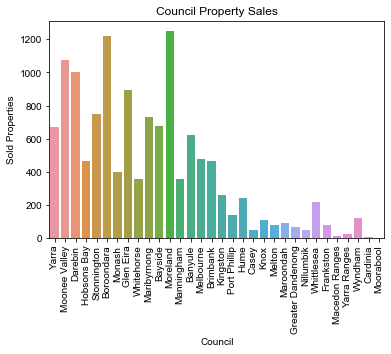

<Figure size 1440x1296 with 0 Axes>

In [35]:
#Visualisation
#sns.countplot(x="CouncilArea", data=df)
#sns.set_style("dark")
#plt.xticks(rotation="vertical")
#plt.title("Council Property Sales")
#plt.xlabel("Council")
#plt.ylabel("Sold Properties")
#plt.figure(figsize=(20, 18))

countplot('CouncilArea', df, 'Council Property Sales', 'Council', 'Sold Properties', 'vertical')

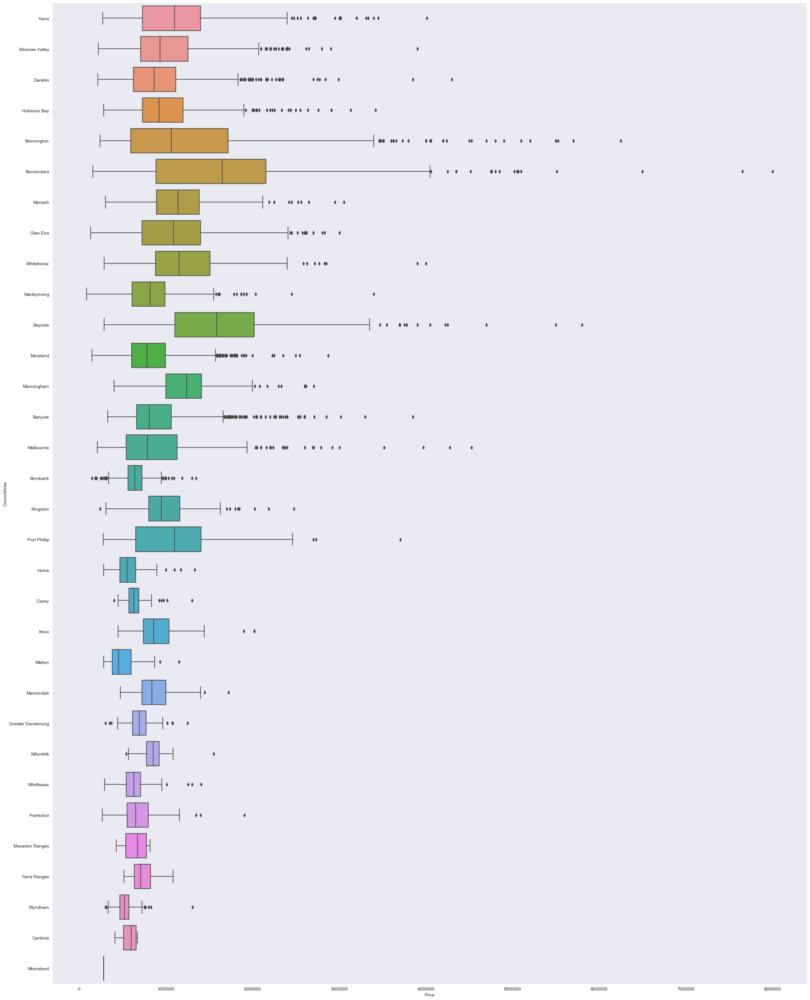

In [36]:
plt.figure(figsize=(30,40))
#sns.boxplot(data=df, x=df["Price"], y=df["CouncilArea"])
boxplot(df, "Price", 'CouncilArea')

### Stonnington, Boroondara, Bayside and Port Phillip have large interquartile ranges. Boroondara has the highest median price of properties sold in the area, as well as the largest interquartile range and the largest maximum value.

In [37]:
#Visualisation on distance from CBD

mapbox(df, "CouncilArea", "Suburb")

### This mapbox shows where the councils are based on colour.

In [38]:
treemap(df, "CouncilArea", "Suburb")

In [39]:
(df.groupby("CouncilArea").mean().sort_values("Landsize", ascending=False)["Landsize"])[0:1]
sortvalues_mean(df, 'CouncilArea', 'Landsize', 'Landsize', 2)

CouncilArea
Macedon Ranges    7296.200000
Yarra Ranges      6103.590909
Name: Landsize, dtype: float64

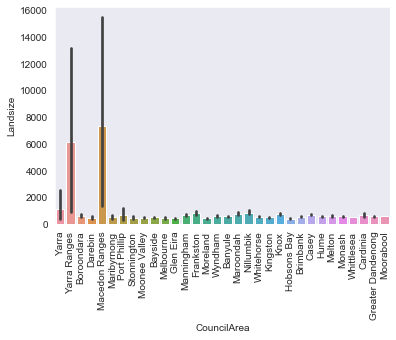

In [40]:
df_size=df.sort_values("Landsize", ascending=False)
barplot(df_size, 'Landsize', 'CouncilArea', 'Landsize')

In [41]:
(df.groupby("CouncilArea").mean().sort_values("Price", ascending=False)["Price"])[0:1]

CouncilArea
Boroondara    1.676508e+06
Name: Price, dtype: float64

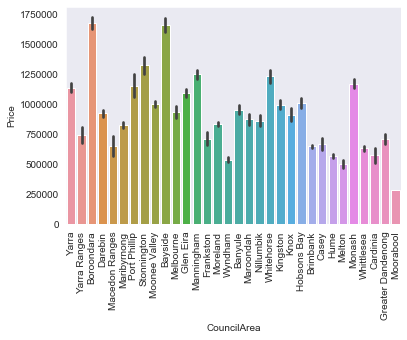

In [42]:
df_price=df.sort_values("Price", ascending=False)
barplot(df_price, 'Price', 'CouncilArea', 'Price')

### This treemap shows which suburbs are in which council. The larger the box, the more sales there were.

## Room quantity statistics

In [43]:
sortvalues_count(df, 'Rooms', 'Type', 'Type', 1)

Rooms
4    3660
Name: Type, dtype: int64

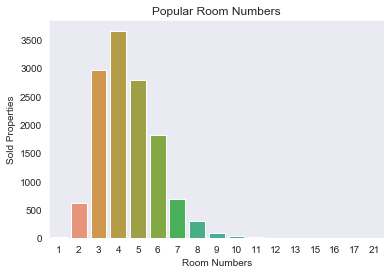

<Figure size 1440x1296 with 0 Axes>

In [44]:
#Which room qunatity is the most common?

countplot('Rooms', df, 'Popular Room Numbers', 'Room Numbers', 'Sold Properties', 'horizontal')

### Properties with four rooms were the most commonly sold.

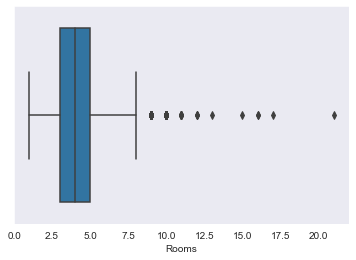

In [45]:
sns.boxplot(x="Rooms", data=df)

### The minimum number of rooms was 0 rooms and the maximum number of rooms was 7(ish) rooms as per this boxplot.

## Seller statistics

In [46]:
#Top 20 Sellers
df["SellerG"].value_counts()[0:20]

#df.groupby("SellerG").sum().sort_values("Postcode", ascending=False)

Nelson           1551
Jellis           1289
hockingstuart    1098
Barry             998
Ray               683
Buxton            622
Marshall          570
Biggin            383
Brad              342
Woodards          294
Fletchers         285
Jas               242
Sweeney           215
Noel              198
Miles             196
McGrath           175
RT                175
Hodges            173
Harcourts         165
Greg              163
Name: SellerG, dtype: int64

### Nelson was the most successful seller, follwed by Jellis Craig and Hocking Stuart.

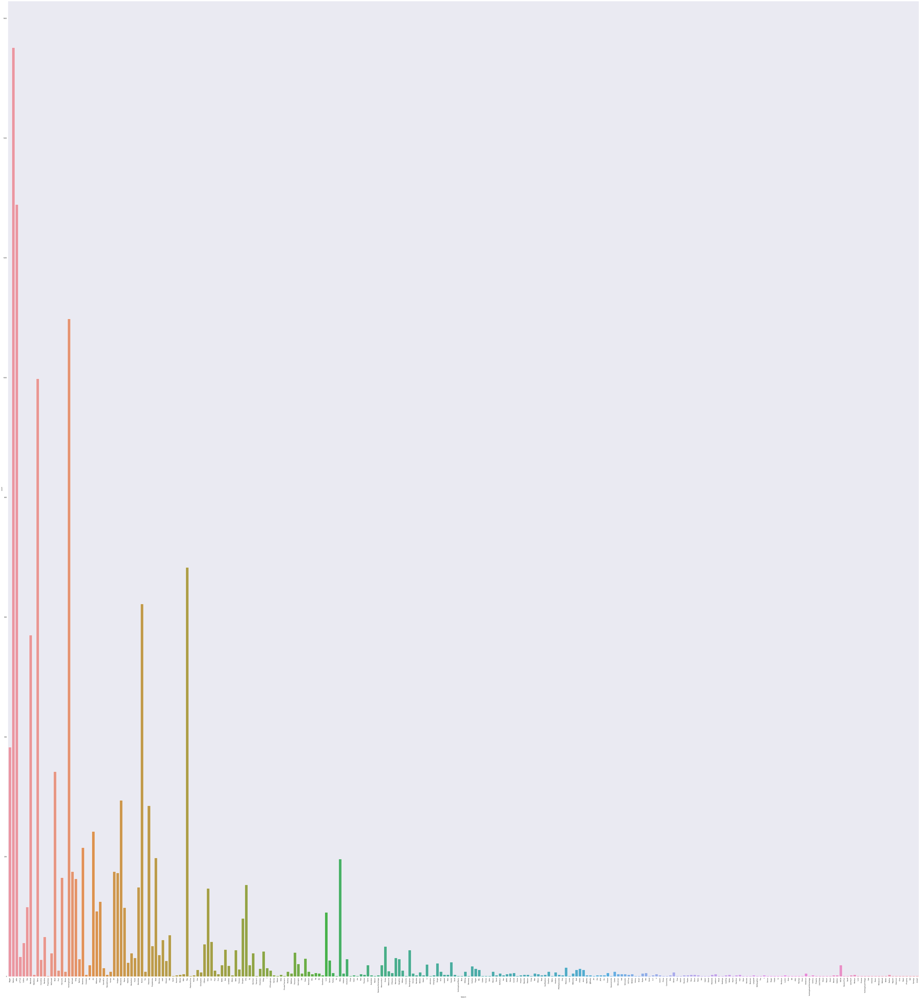

In [47]:
plt.subplots(figsize=(100, 110))
sns.countplot(data=df, x=df["SellerG"])
plt.xticks(rotation="vertical")
plt.show()

### This is a plot showing every single company in Melbourne and how successful they were.

In [48]:
mapbox(df, 'SellerG', 'SellerG')

### Map showing the sellers of each property based on colour.

### Most common types of properties

In [49]:
pie(df, "Type")

In [50]:
mapbox(df, 'Type', 'Suburb')

### Map shows the types of properties and where they were sold.

### Houses were the most highly sold, with townhouses in second and units in third place.

In [51]:
# Most successful month in 2016
((df.loc[df["Year"] == "2016"]).groupby("Month").count().sort_values("Propertycount", ascending=False))["Propertycount"][0:1]

Month
November    1074
Name: Propertycount, dtype: int64

### November was the most successful month in 2016, with 1114 sales.

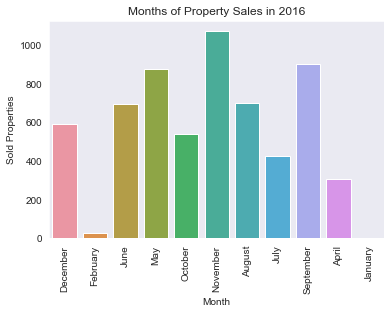

<Figure size 1440x1296 with 0 Axes>

In [52]:
df2016 = df.loc[df["Year"] == "2016"]
countplot('Month', df2016, "Months of Property Sales in 2016", "Month", "Sold Properties", 'vertical')

In [53]:
# Most successful month in 2017
df2017 = df.loc[df["Year"] == "2017"]
sortvalues_count(df2017, 'Month', 'Propertycount', 'Propertycount', 1)

Month
July    1501
Name: Propertycount, dtype: int64

### July was the most successful month in 2017 with 1534 sales.

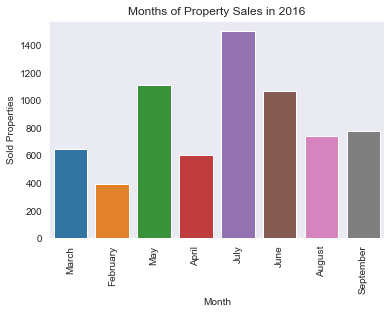

<Figure size 1440x1296 with 0 Axes>

In [54]:
countplot('Month', df2017, "Months of Property Sales in 2016", "Month", "Sold Properties", 'vertical')

In [55]:
df2016

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea,Month,Year,Month/Year
0,Abbotsford,85 Turner St,3,h,1480000.0,S,Biggin,3/12/2016,2.5,3067,...,145.0,0,-37.7996,144.9984,Northern Metropolitan,4019,Yarra,December,2016,December 2016
1,Abbotsford,25 Bloomburg St,3,h,1035000.0,S,Biggin,4/02/2016,2.5,3067,...,79.0,1900,-37.8079,144.9934,Northern Metropolitan,4019,Yarra,February,2016,February 2016
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067,...,142.0,2014,-37.8072,144.9941,Northern Metropolitan,4019,Yarra,June,2016,June 2016
5,Abbotsford,129 Charles St,3,h,941000.0,S,Jellis,7/05/2016,2.5,3067,...,145.0,0,-37.8041,144.9953,Northern Metropolitan,4019,Yarra,May,2016,May 2016
6,Abbotsford,124 Yarra St,6,h,1876000.0,S,Nelson,7/05/2016,2.5,3067,...,210.0,1910,-37.8024,144.9993,Northern Metropolitan,4019,Yarra,May,2016,May 2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13203,South Kingsville,41 Saltley St,5,t,855000.0,SP,Greg,27/11/2016,9.1,3015,...,130.0,0,-37.8288,144.8681,Western Metropolitan,984,Hobsons Bay,November,2016,November 2016
13204,South Kingsville,56b Vernon St,3,t,611000.0,SP,Williams,28/08/2016,9.1,3015,...,100.0,2000,-37.8317,144.8713,Western Metropolitan,984,Hobsons Bay,August,2016,August 2016
13205,Keilor Park,5/8 Swan St,3,t,380000.0,S,Nelson,10/09/2016,14.5,3042,...,100.0,2010,-37.7251,144.8621,Western Metropolitan,1119,Brimbank,September,2016,September 2016
13206,Keilor Park,44 Erebus St,7,t,746000.0,S,Barry,22/05/2016,14.5,3042,...,174.0,1970,-37.7231,144.8602,Western Metropolitan,1119,Brimbank,May,2016,May 2016


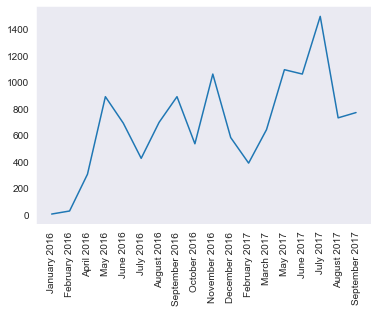

In [56]:
#Graphing sales trends

sortvalues_count(df, 'Month/Year', 'Type', 'Type', 20)

#x = df["Month/Year"].value_counts()
x = ["January 2016", "February 2016", "April 2016", "May 2016", "June 2016", "July 2016", "August 2016", "September 2016", 
     "October 2016", "November 2016", "December 2016", "February 2017", "March 2017", "May 2017", "June 2017",
    "July 2017", "August 2017", "September 2017"]

y = [2, 25, 303, 889, 689, 423, 695, 889, 533, 1060, 580, 387, 640, 1093, 1060, 1496, 729, 769, ]


plt.plot(x, y)
sns.set_style("dark")
plt.xticks(rotation="vertical")
plt.show()

### The plot shows how many properties were sold each month as shown in the dataset, based on month and year.

### Most popular region name

In [57]:
df["Regionname"].value_counts()

Southern Metropolitan         4192
Northern Metropolitan         3844
Western Metropolitan          2931
Eastern Metropolitan          1436
South-Eastern Metropolitan     443
Eastern Victoria                52
Northern Victoria               36
Western Victoria                32
Name: Regionname, dtype: int64

### Southern Metropolian was the region with the most sales.

In [58]:
pie(df, "Regionname")

### This ring chart shows the percentage of properties sold in each of the administrative regions.

In [59]:
treemap(df, 'Regionname', 'Suburb')

### This treemap shows which suburbs are in which administrative region. It also shows, based on the size of the box, how many sales there were.

In [60]:
mapbox(df, 'Regionname', 'Suburb')

### The above map shows where the administrative regions are.

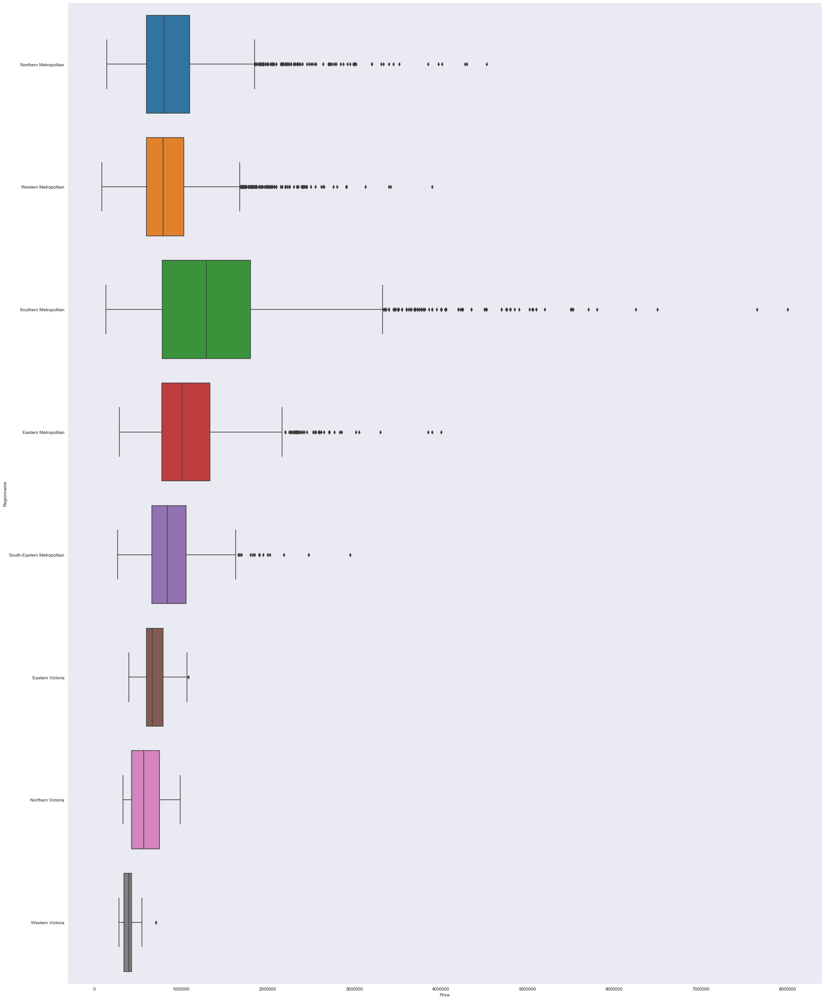

In [61]:
plt.figure(figsize=(30,40))
boxplot(df, "Price", "Regionname")

### The box plot even shows that the Southern Metropolitan area has the highest median price and maximum price.

In [62]:
#(df.groupby("Regionname").mean().sort_values("Landsize", ascending=False))["Landsize"][0:1]


(df.groupby("Regionname").mean().sort_values("Landsize", ascending=False))["Landsize"]


Regionname
Eastern Victoria              2975.442308
Northern Victoria             2545.611111
Western Victoria               655.500000
Eastern Metropolitan           630.924095
South-Eastern Metropolitan     612.693002
Northern Metropolitan          567.253642
Southern Metropolitan          526.795802
Western Metropolitan           492.621290
Name: Landsize, dtype: float64

### Northern, Eastern and Western Victoria had the lowest number of sales with more land bought while the metropolitan areas had high sales but less land was bought. Also because this is a Melbourne dataset and does not include much of regional Victoria.

## Types of sales

In [63]:
#df["Method"].value_counts()

#px.pie(df, df["Method"], hole=0.3)

pie(df, "Method")

### S (property sold) was the most common form of sale method.

### Which suburb had the highest median price?

In [64]:
#Which suburb had the highest median price?
(df.groupby("Suburb").median().sort_values("Price", ascending=False))["Price"][0:1]

Suburb
Kooyong    2185000.0
Name: Price, dtype: float64

### Kooyong has the highest median price at $1858500.

### Which suburb had the highest median price (Top 20)?

In [65]:
(df.groupby("Suburb").median().sort_values("Price", ascending=False))["Price"][0:20]

Suburb
Kooyong          2185000.0
Eaglemont        1901000.0
Canterbury       1890000.0
Balwyn           1850000.0
Brighton         1773500.0
Kew East         1750000.0
Ivanhoe East     1740000.0
Sandringham      1710000.0
Princes Hill     1700000.0
Balwyn North     1700000.0
Camberwell       1695000.0
Ashburton        1658500.0
Glen Iris        1650000.0
Beaumaris        1635500.0
Hampton          1612500.0
Malvern          1611000.0
Mont Albert      1587000.0
Brighton East    1585000.0
Surrey Hills     1570000.0
Kew              1528500.0
Name: Price, dtype: float64

### Which suburb on average has the largest average size properties?

In [66]:
(df.groupby("Suburb").mean().sort_values("BuildingArea", ascending=False))["BuildingArea"][0:5]

Suburb
Pakenham          332.666667
Riddells Creek    272.400000
Clarinda          265.250000
Bulleen           262.098592
Kooyong           242.000000
Name: BuildingArea, dtype: float64

### Pakenham had the largest average size properties.

In [67]:
sortvalues_count(df_h, 'SellerG', 'Price', 'Price', 1) #Nelson. 1160.
sortvalues_count(df_u, 'SellerG', 'Price', 'Price', 1) #Hocking Stuart. 397.
sortvalues_count(df_t, 'SellerG', 'Price', 'Price', 1) #Nelson. 134.

SellerG
Nelson    134
Name: Price, dtype: int64

### Nelson sold the highest number of homes at 85. Hocking Stuart sold the highest number of units at 194. Nelson sold the highest number of townhouses at 85.

In [68]:
sortvalues_count(df_h, 'Regionname', 'Price', 'Price', 1) #Southern Metropolitan. 2754.
sortvalues_count(df_u, 'Regionname', 'Price', 'Price', 1) #Southern Metropolitan. 1549.
sortvalues_count(df_t, 'Regionname', 'Price', 'Price', 1) #Southern Metropolitan. 425.

Regionname
Southern Metropolitan    441
Name: Price, dtype: int64

In [69]:
#The council of Moreland sold the most houses. 914.
sortvalues_count(df_h, 'CouncilArea', 'Price', 'Price', 1)

CouncilArea
Moreland    914
Name: Price, dtype: int64

In [70]:
sortvalues_count(df_u, 'CouncilArea', 'Price', 'Price', 1)
#The council of Stonnington sold the most units. 361.

CouncilArea
Stonnington    361
Name: Price, dtype: int64

In [71]:
sortvalues_count(df_t, 'CouncilArea', 'Price', 'Price', 1)
#The council of Moreland sold the most townhouses. 148.

CouncilArea
Moreland    148
Name: Price, dtype: int64

### The Southern Metropolitan region saw the highest number of houses, units and townhouses being sold at 1220 houses, 742 units and 204 townhouses.

In [72]:
pie(df_h, 'Method')

In [73]:
pie(df_u, 'Method')

In [74]:
pie(df_t, 'Method')

In [75]:
sortvalues_mean(df_h, "SellerG", "Price", "Price", 1) #Sotheby's had the highest average prices of sales. $3.858333e+06.
sortvalues_mean(df_u, "SellerG", "Price", "Price", 1) #Scott had the highest average prices of sales. $1860000.0.
sortvalues_mean(df_t, "SellerG", "Price", "Price", 1) #Castran had the highest average prices of sales. $2175000.0. 

SellerG
Castran    2175000.0
Name: Price, dtype: float64

### The pie charts show which selling method was the most common with houses, units and townhouses.

## Selling method

In [76]:
mapbox(df, 'Method', 'Price')

### Map displays the properties sold and their selling method.

In [77]:
pie(df, 'Method')

### Ring chart shows that S (sold) was the highest selling method at 66.4%.

## Other data

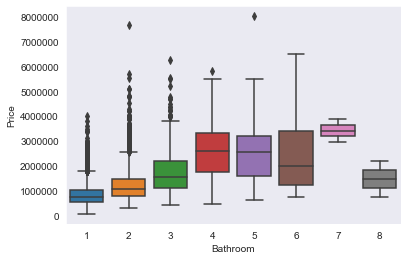

In [78]:
#sns.boxplot(data=df, x="Bathroom", y="Price")
boxplot(df, 'Bathroom', 'Price')

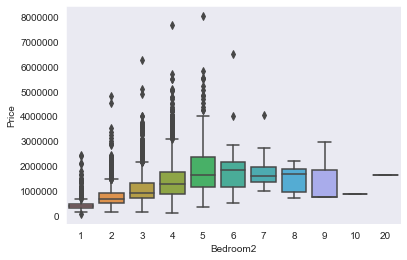

In [79]:
#sns.boxplot(data=df, x="Bedroom2", y="Price")
boxplot(df, 'Bedroom2', 'Price')

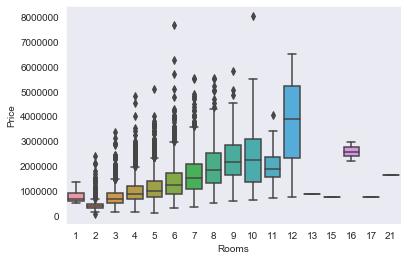

In [80]:
#sns.boxplot(data=df, x="Rooms", y="Price")
boxplot(df, 'Rooms', 'Price')

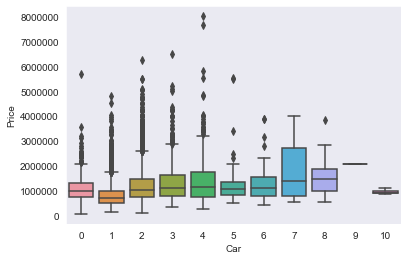

In [81]:
#sns.boxplot(data=df, x="Car", y="Price")
boxplot(df, 'Car', 'Price')

## Suburb-based data as well as year-built based data

In [82]:
#Kooyong has the highest average property prices. $2185000.0
sortvalues_mean(df, "Suburb", "Price", "Price", 1)

Suburb
Kooyong    2185000.0
Name: Price, dtype: float64

In [83]:
df.sort_values("Price", ascending=False)[0:1]
#Canterbury has the most expensive house. $8000000.0.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea,Month,Year,Month/Year
5125,Canterbury,49 Mangarra Rd,10,h,8000000.0,VB,Sotheby's,13/05/2017,9.0,3126,...,464.3,1880,-37.8179,145.0694,Southern Metropolitan,3265,Boroondara,May,2017,May 2017


In [84]:
df.sort_values("Price", ascending=True)[0:1]
#Footscray saw the most cheap listing, which was a unit at just $85,000.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea,Month,Year,Month/Year
10172,Footscray,202/51 Gordon St,2,u,85000.0,PI,Burnham,3/09/2016,6.4,3011,...,75.0,2007,-37.7911,144.89,Western Metropolitan,7570,Maribyrnong,September,2016,September 2016


In [85]:
df_nozero.sort_values("YearBuilt", ascending=True)[0:1]
#Oldest property is in Collingwood. Property was built in 1830.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea,Month,Year,Month/Year
9962,Collingwood,2/79 Oxford St,3,u,855000.0,S,Nelson,3/09/2016,1.6,3066,...,122.0,1830,-37.8042,144.9845,Northern Metropolitan,4553,Yarra,September,2016,September 2016


In [86]:
df_nozero.sort_values("YearBuilt", ascending=False)[0:1]
#Most recent property was built in 2018. Property must have been purchased in 2016 before it was built.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea,Month,Year,Month/Year
933,Brighton East,8 Thomas St,7,h,1310000.0,S,Buxton,24/09/2016,10.7,3187,...,250.0,2018,-37.9182,145.0231,Southern Metropolitan,6938,Bayside,September,2016,September 2016


In [87]:
df_nozero.groupby("YearBuilt").count().sort_values("Suburb", ascending=False)["Suburb"][0:1]
#Most properties in this dataset were built in 1970. 818 properties.

YearBuilt
1970    825
Name: Suburb, dtype: int64

In [88]:
#North Warrandyte on average has the most rooms in properties sold. 7.0.
sortvalues_mean(df, 'Suburb', 'Rooms', 'Rooms', 1)

Suburb
North Warrandyte    7.0
Name: Rooms, dtype: float64

In [89]:
df_18=df_nozero.loc[df_nozero["YearBuilt"]<1900]
sortvalues_count(df_18, 'Suburb', 'YearBuilt', 'YearBuilt', 1)
#Brunswick has the most properties from the 1800s, sold between 2016 and 2017. 22.

Suburb
Brunswick    22
Name: YearBuilt, dtype: int64

In [90]:
df_20=df_nozero.loc[df_nozero["YearBuilt"]>=2000]
sortvalues_count(df_20, 'Suburb', 'YearBuilt', 'YearBuilt', 1)
#Richmond has the most properties built in the 2000s. 68 properties.

Suburb
Richmond    68
Name: YearBuilt, dtype: int64

In [91]:
#South Yarra has the most units. 146 units.
sortvalues_count(df_u, 'Suburb', 'Type', 'Type', 1)

Suburb
South Yarra    146
Name: Type, dtype: int64

In [92]:
#df_u.groupby("Rooms").count().sort_values("Type", ascending=False)["Type"]
sortvalues_count(df_u, 'Rooms', 'Type', 'Type', 8)
#Most units have 2 rooms.

Rooms
2    1944
1     613
3     454
4      21
6       1
8       1
Name: Type, dtype: int64

In [93]:
df_u.loc[df_u["Bathroom"] == 1]

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,CouncilArea
8,Abbotsford,6/241 Nicholson St,1,u,300000.0,S,Biggin,8/10/2016,2.5,3067.0,...,1.0,1.0,0.0,75.0,NaN,-37.80080,144.99730,Northern Metropolitan,4019.0,Yarra
14,Abbotsford,7/20 Abbotsford St,1,u,441000.0,SP,Greg,14/05/2016,2.5,3067.0,...,1.0,1.0,0.0,75.0,NaN,-37.80160,144.99880,Northern Metropolitan,4019.0,Yarra
23,Abbotsford,6/219 Nicholson St,2,u,500000.0,S,Collins,18/06/2016,2.5,3067.0,...,1.0,1.0,0.0,60.0,1970.0,-37.80150,144.99720,Northern Metropolitan,4019.0,Yarra
26,Abbotsford,5/20 Abbotsford St,1,u,426000.0,SP,Greg,22/08/2016,2.5,3067.0,...,1.0,1.0,0.0,75.0,NaN,-37.80160,144.99880,Northern Metropolitan,4019.0,Yarra
28,Abbotsford,116/56 Nicholson St,1,u,457000.0,S,Jellis,22/08/2016,2.5,3067.0,...,1.0,1.0,0.0,50.0,NaN,-37.80780,144.99650,Northern Metropolitan,4019.0,Yarra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13453,Hoppers Crossing,3/14 Moffatt Cr,2,u,315000.0,S,Triwest,26/08/2017,18.4,3029.0,...,1.0,1.0,150.0,75.0,NaN,-37.87715,144.69863,Western Metropolitan,13830.0,Wyndham
13482,Malvern East,2002 Malvern Rd,2,u,651000.0,SP,Jellis,26/08/2017,8.4,3145.0,...,1.0,1.0,129.0,97.0,1940.0,-37.87798,145.06731,Southern Metropolitan,8801.0,Stonnington
13495,Moonee Ponds,1/53 Buckley St,2,u,435000.0,S,Nelson,26/08/2017,6.2,3039.0,...,1.0,1.0,1475.0,66.0,1970.0,-37.75799,144.92354,Western Metropolitan,6232.0,Moonee Valley
13510,Nunawading,3/39 Lemon Gr,2,u,710000.0,S,Jellis,26/08/2017,15.4,3131.0,...,1.0,1.0,903.0,75.0,1985.0,-37.80640,145.18452,Eastern Metropolitan,4973.0,NaN


In [94]:
#Most units have 1 bathroom. 2441.
(df_u.groupby('Bathroom').count().sort_values("Type", ascending=False))['Type']

Bathroom
1.0    2457
2.0     549
0.0      17
3.0      10
4.0       1
Name: Type, dtype: int64

In [95]:
#Bentleigh East has the most townhouses. 47.
sortvalues_count(df_t, 'Suburb', 'Type', 'Type', 1)

Suburb
Bentleigh East    47
Name: Type, dtype: int64

In [96]:
#Most townhouses have  rooms 3 in total.
sortvalues_count(df_t, 'Rooms', 'Type', 'Type', 7)

Rooms
3    635
2    320
4    156
1     12
5      5
Name: Type, dtype: int64

In [97]:
#Most townhouses have 2 bathrooms.
(df_t.groupby('Bathroom').count().sort_values("Type", ascending=False))['Type']

Bathroom
2.0    697
1.0    319
3.0    107
4.0      3
0.0      2
Name: Type, dtype: int64

In [98]:
#Reservoir has the most houses. 253
sortvalues_count(df_h, 'Suburb', 'Type', 'Type', 1)

Suburb
Reservoir    253
Name: Type, dtype: int64

In [99]:
#Most houses have 3 rooms.
sortvalues_count(df_h, 'Rooms', 'Type', 'Type', 1)

Rooms
3    4827
Name: Type, dtype: int64

In [100]:
df_h.groupby("Bathroom").count().sort_values("Type", ascending=False)["Type"]
#Most houses have 1 bathroom.

Bathroom
1.0    4779
2.0    3769
3.0     828
4.0     105
5.0      29
0.0      15
6.0       5
7.0       2
8.0       2
Name: Type, dtype: int64

In [101]:
mapbox(df_nozero, 'YearBuilt', 'YearBuilt')

## Correlations

In [102]:
def heatmap(data):
    plt.figure(figsize=(25,20))
    sns.set_context("paper", font_scale=1.4)
    data_mx = data.corr()
    sns.heatmap(data_mx, annot=True, cmap="Blues")

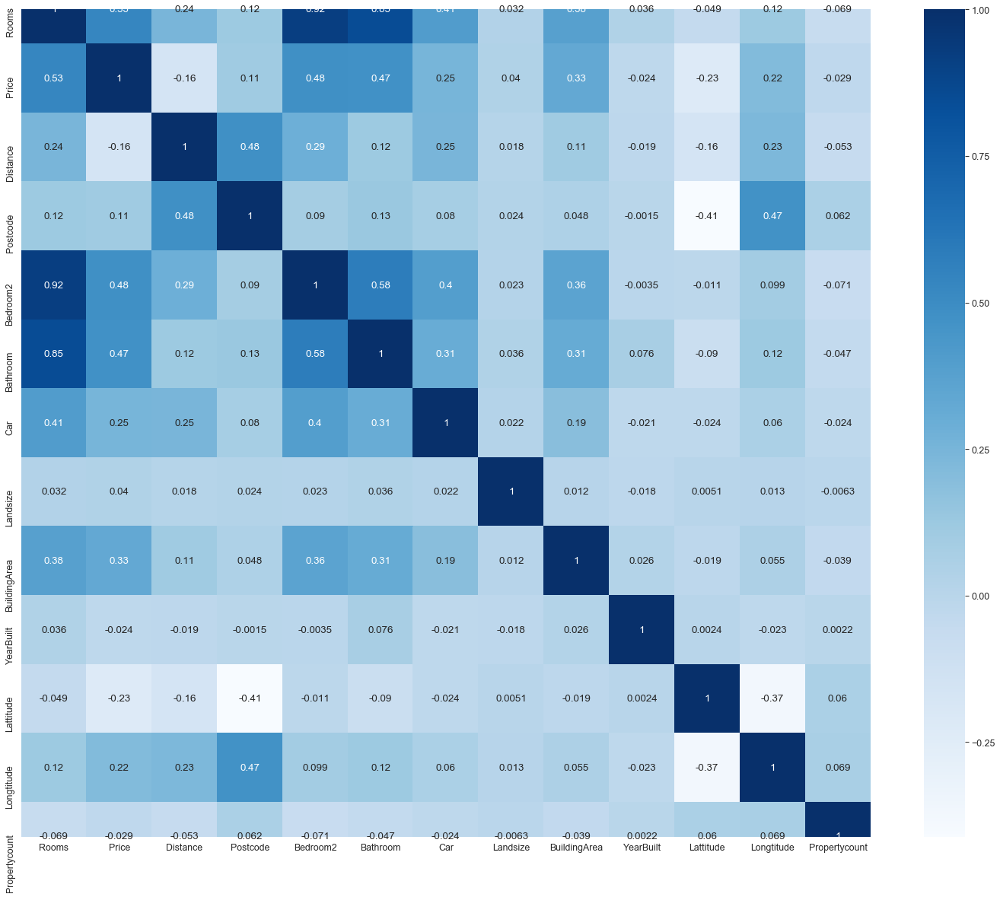

In [103]:
#Heatmap to display all pearson correlations.
heatmap(df)

### This heatmap above shows Pearson correlations. -1 is negative correlation. 1 is positive correlation. 0 is no correlation.

In [104]:
resevoir=df.loc[df["Suburb"] == "Reservoir"]
richmond=df.loc[df["Suburb"] == "Richmond"]
brunswick=df.loc[df["Suburb"] == "Brunswick"]

### Correlations can be inaccurate for all of Melbourne so we are taking heatmaps for the most popular suburbs to find out more accurate results. (Reservoir, Richmond and Brunswick).


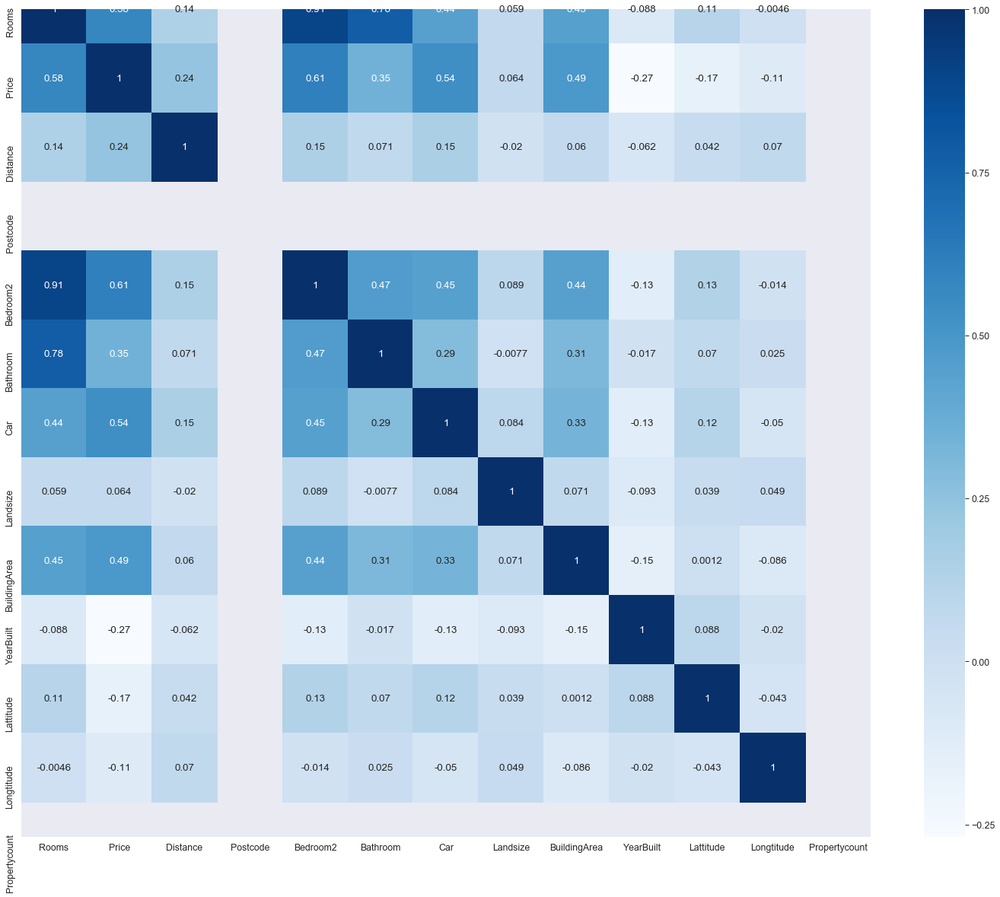

In [105]:
heatmap(resevoir)

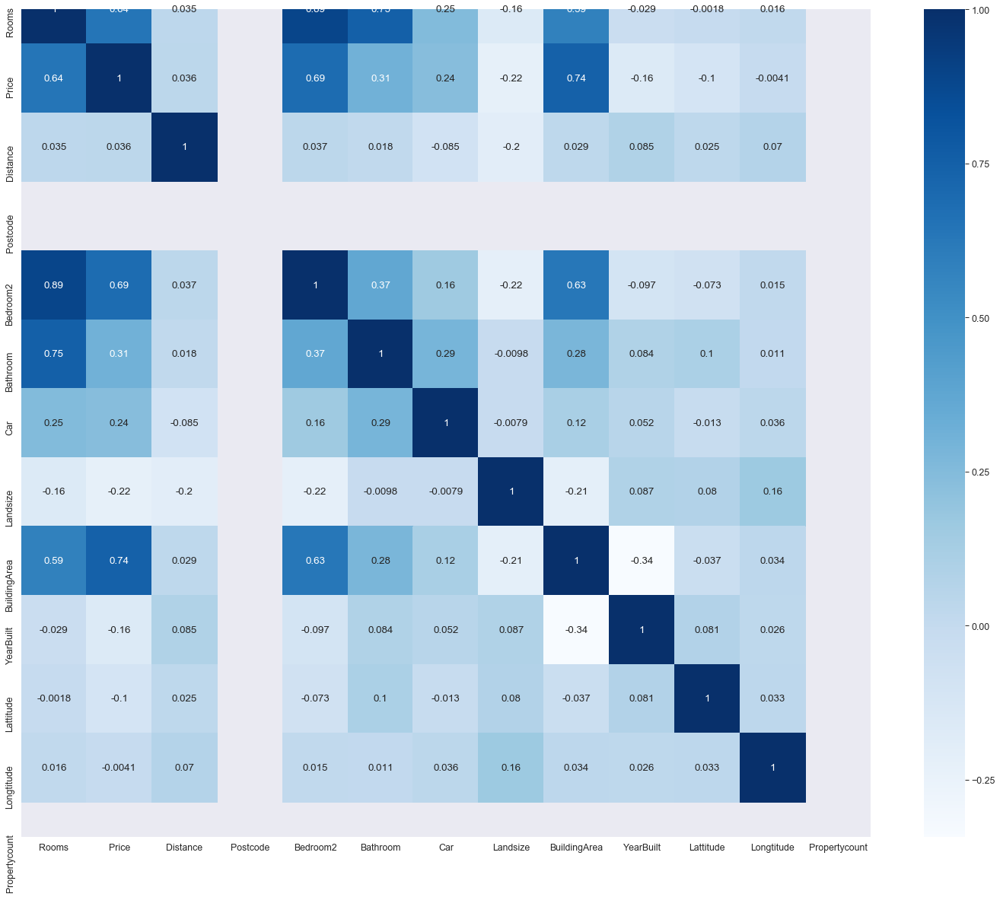

In [106]:
heatmap(richmond)

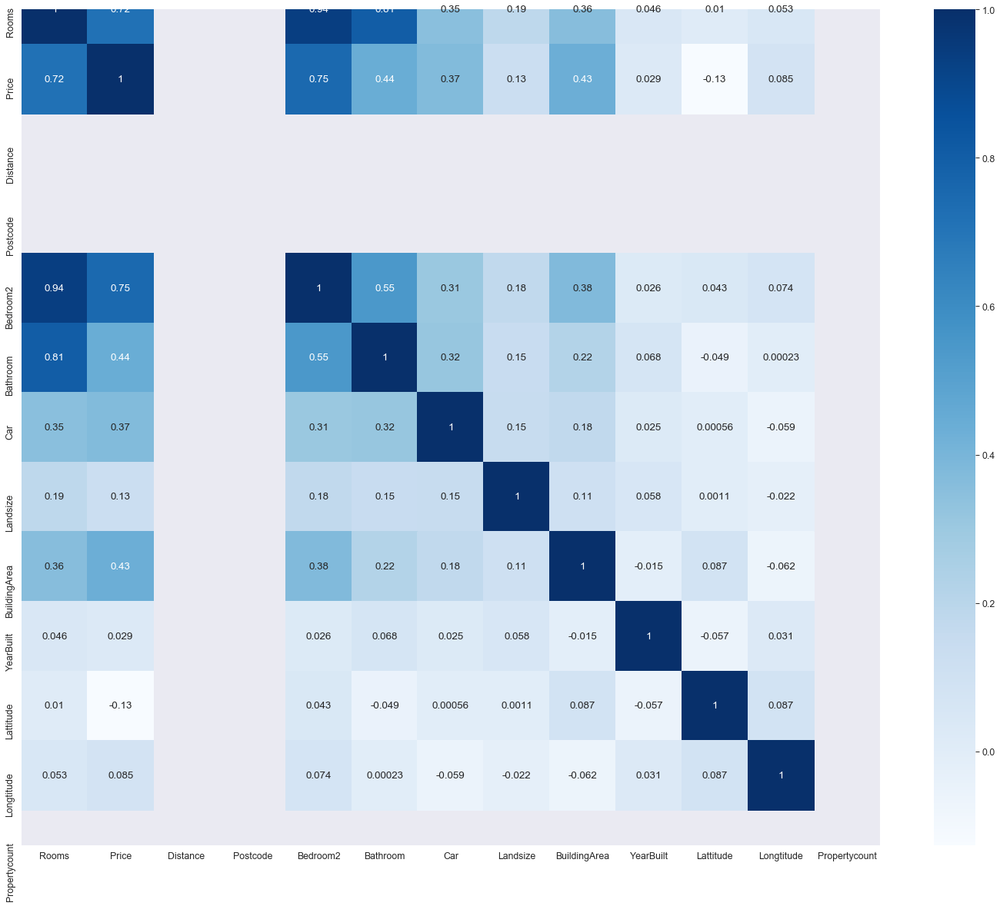

In [107]:
heatmap(brunswick)

### The three heatmaps shown above are for the three highest-selling suburbs for improved results as house prices are different in different areas in Melbourne. The highest-selling suburbs were chosen as they had the highest number of entries in the dataset.

### Pearson's correlations all over Melbourne: the price and the number of bedrooms in a house has a positive correlation of 0.49. The price and building area have a positive correlation of 0.28. The price and the number of bathrooms are positively correlated at 0.47. The most positive amount of correlation observed was with the number of bedrooms and the total number of rooms which was at 0.94, because the more bedrooms, the more rooms in general.

In [108]:
#Pearson correlations: does price increase when rooms increase? Does price increase with building area?

arr1=np.array(df["Price"])
arr2=np.array(df["Rooms"])
arr3=np.array(df["BuildingArea"])
arr4=np.array(df["Distance"])
arr5=np.array(df["Bedroom2"])
arr6=np.array(df["Bathroom"])
arr7=np.array(df['Car'])
arr8=np.array(df['Landsize'])
arr9=np.array(df['BuildingArea'])
arr10=np.array(df['Propertycount'])
arr11 = np.array(df["YearBuilt"])
arr12 = np.array(df["Date"])

In [147]:
np.corrcoef(arr1, arr2) #Pearson correlation: 0.53461438 between price and rooms.
np.corrcoef(arr1, arr3) #Pearson correlation: 0.3280872 between price and building area.
np.corrcoef(arr1, arr4) #Pearson correlation: -0.15797084 between price and distance.
np.corrcoef(arr1, arr5) #Pearson correlation: 0.4809081 between price and bedrooms.
np.corrcoef(arr1, arr6) #Pearson correlation: 0.47475867 between price and bathrooms.
np.corrcoef(arr1, arr7) #Pearson correlation: 0.2506132 between price and bathrooms.
np.corrcoef(arr2, arr5) #Pearson correlation: 0.91640259 between room numbers and bedrooms.
np.corrcoef(arr2, arr3) #Pearson correlation: 0.38175471 between room numbers and building area.
np.corrcoef(arr1, arr11) #Pearson correlation: -0.02409909 between price and the year built.
np.corrcoef(arr2, arr6) #Pearson correlation: 0.84680754 between the room numbers and number of bathrooms.

array([[1.        , 0.84680754],
       [0.84680754, 1.        ]])

In [158]:
#Spearman's rank.

df[["Price", "Rooms"]].corr(method="spearman") #Spearman's rank: 0.543278 between price and rooms.
df[["Price", "BuildingArea"]].corr(method="spearman") #Spearman's rank: 0.564229 between price and building area.
df[["Price", "Distance"]].corr(method="spearman") #Spearman's rank: -0.128044 between price and distance from CBD.
df[["Price", "Bedroom2"]].corr(method="spearman") #Spearman's rank: 0.521744 between room numbers and building area.
df[["Price", "Bathroom"]].corr(method="spearman") #Spearman's rank: 0.427282 between room numbers and building area.
df[["Price", "Car"]].corr(method="spearman") #Spearman's rank: 0.297791 between room numbers and building area.

,Price,Car
Price,1.000000,0.297791
Car,0.297791,1.000000


In [113]:
mean_price=df["Price"].mean() 
mean_std=df["Price"].std()
df["Price_ZScore"] = (df["Price"] - mean_price)/mean_std

In [114]:
mean_size=df["Landsize"].mean() 
mean_size_std=df["Landsize"].std()
df["Landsize_ZScore"] = (df["Landsize"] - mean_size)/mean_size_std

In [115]:
mean_area=df["BuildingArea"].mean() 
mean_area_std=df["BuildingArea"].std()
df["BuildingArea_ZScore"] = (df["BuildingArea"] - mean_area)/mean_area_std

### Above, the numerical attributes were converted to an array format, and the zscores of each were calculated.

# Julian's code
### Here are all the graphs I have drawn up.

In [170]:
mapbox(df, 'Bedroom2', 'Bedroom2')

In [117]:
#px.scatter_mapbox(df, lat="Lattitude", lon="Longtitude", color="Landsize", mapbox_style="open-street-map", size="Landsize")
#mapbox(df, 'Landsize', 'Landsize', edge)

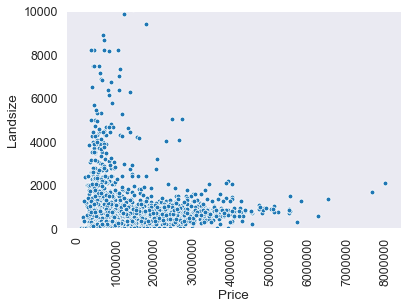

In [118]:
plot = sns.scatterplot(data=df, x=df["Price"], y=df["Landsize"])
plt.xticks(rotation='vertical')
plt.ylim(0, 10000)
plt.show()

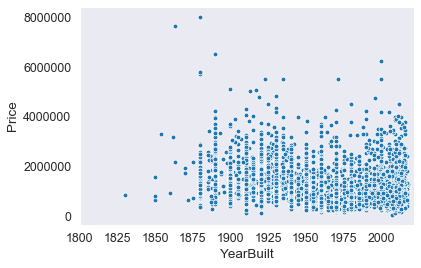

In [119]:
plot = sns.scatterplot(data=df, x=df["YearBuilt"], y=df["Price"])
plot.set_xlim(left=1800, right=2022)
plt.show()

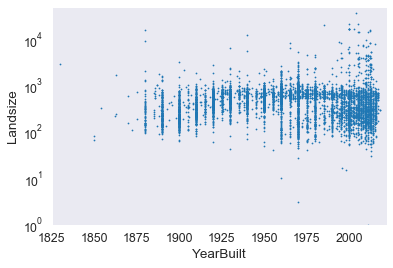

In [120]:
plot = sns.scatterplot(data=df, x=df["YearBuilt"], y=df["Landsize"], s=1, edgecolor=None)
plot.set_xlim(left=1825, right=2022)
plot.set_ylim(bottom=1, top=50000)
plot.set(yscale="log")
plt.show()

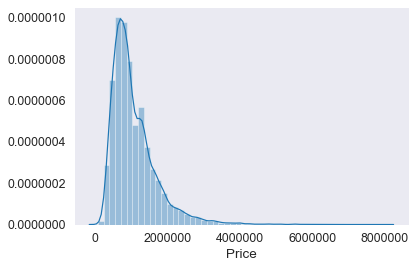

In [121]:
sns.distplot(df['Price'])

In [122]:
df_filtered = df[df["YearBuilt"] != 0]
df_filtered["YearBuilt"].mode()

0    1970
dtype: int32

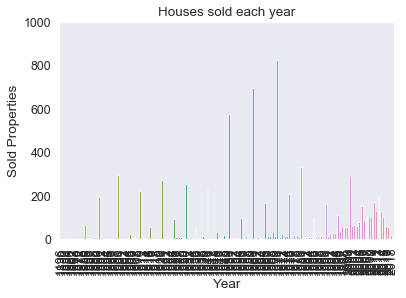

In [123]:
sns.countplot(x=df_filtered["YearBuilt"], data=df_filtered)
plt.title("Houses sold each year")
plt.xlabel("Year")
plt.xticks(rotation='vertical')
# plt.set_xticklabels([1825, 1850, 1875, 1900, 1925, 1950, 1975, 2000, 2023])
# plt.xlim(1825, 2023)
plt.ylim(0, 1000)
# plt.xticks(range(1825, 2025, 25))
plt.ylabel("Sold Properties")
plt.show()

In [124]:
df_1970=df_filtered[df_filtered["YearBuilt"] == 1970]
df_1970
print(len(df_1970))

825


In [125]:
#mapbox(df_1970, "YearBuilt", 'YearBuilt')

(1820, 2000)

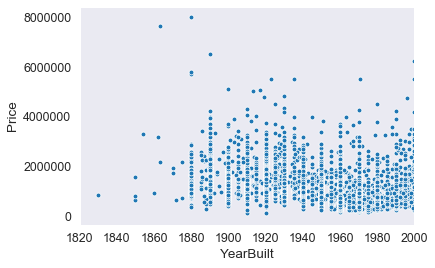

In [126]:
sns.scatterplot(data=df_filtered, x='YearBuilt', y='Price')
plt.xlim(1820, 2000)

In [127]:
melbourne=df.loc[df['Distance'] == 0]

In [167]:
def confidence_interval(frac, attribute):
    ci=pd.DataFrame(df, columns={'{}'.format(attribute):df[attribute]})
    ci=ci.sample(frac=frac)
    mean = ci[attribute].mean()
    std = ci.std()
    std = std[0]
    size = len(ci)
    std_error=std/np.sqrt(size)
    x=std_error * 2.16
    upper = mean + x
    lower = mean - x
    
    return lower, upper, df[attribute].mean()

confidence_interval(0.5, 'Price')

(1062615.946937417, 1097027.5273800285, 1071850.6503933363)

In [168]:
confidence_interval(0.5, 'Landsize')

(496.90413960448114, 575.1196148301942, 561.2752583680395)

In [131]:
df['Price_ZScore'].mean()

9.30862838778919e-16

In [132]:
df['Price_ZScore'].mean()

9.30862838778919e-16

In [133]:
df['Landsize_ZScore'].mean()

2.2536367171448313e-16

In [134]:
df['BuildingArea_ZScore'].mean()

1.8890937968117187e-15